In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

In [9]:
# Carga desde un archivo .csv sin indice
df = pd.read_csv('Amsterdam_EntireHomeApt.csv')
df = df.drop(columns = ["Unnamed: 0"])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7776 entries, 0 to 7775
Data columns (total 50 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   last_scraped                                  7776 non-null   object 
 1   name                                          7776 non-null   object 
 2   host_name                                     7776 non-null   object 
 3   host_since                                    7776 non-null   object 
 4   host_response_time                            7776 non-null   object 
 5   host_response_rate                            7776 non-null   object 
 6   host_acceptance_rate                          7776 non-null   object 
 7   host_is_superhost                             7776 non-null   object 
 8   host_identity_verified                        7776 non-null   object 
 9   neighbourhood                                 7776 non-null   o

In [ ]:
# Convertir la variable a tipo numerica 
encoder = LabelEncoder()
df['property_type'] = encoder.fit_transform(df['property_type'])

# Obtener el mapeo de categorías a números
categorias = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))

# Mostrar el diccionario con la correspondencia
categorias

{'Barn': 0, 'Boat': 1, 'Camper/RV': 2, 'Casa particular': 3, 'Cave': 4, 'Earthen home': 5, 'Entire cabin': 6, 'Entire chalet': 7, 'Entire condo': 8, 'Entire cottage': 9, 'Entire guest suite': 10, 'Entire guesthouse': 11, 'Entire home': 12, 'Entire loft': 13, 'Entire place': 14, 'Entire rental unit': 15, 'Entire serviced apartment': 16, 'Entire townhouse': 17, 'Entire vacation home': 18, 'Entire villa': 19, 'Houseboat': 20, 'Room in aparthotel': 21, 'Tiny home': 22, 'Yurt': 23}


<Axes: xlabel='property_type', ylabel='price'>

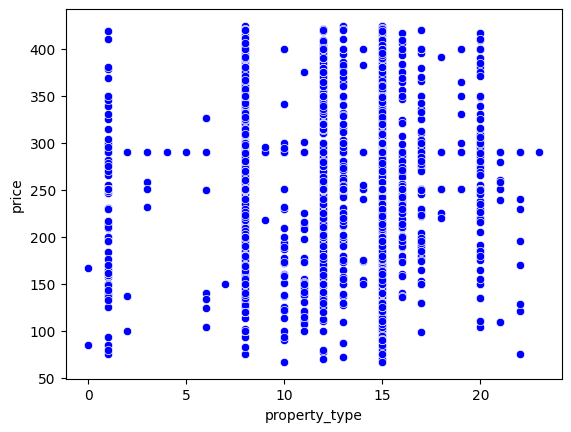

In [ ]:
# Imprimimos el scatter plot entre la variable dependiente (price) e independiente (property_type) 
# para observar el comportamiento en su dipersión
from turtle import color

sns.scatterplot(x='property_type', y = 'price', color="blue", data = df)

In [12]:
# Declaramos las variables dependientes e independientes para la regresión lineal
Vars_Indep = df[['property_type']]
Var_Dep = df ['price']

In [13]:
# Se define model como la función de regresión lineal 
from sklearn.linear_model import LinearRegression
model = LinearRegression()

# Verificamos la función relacioanada al modelo 
type(model)

sklearn.linear_model._base.LinearRegression

In [14]:
# Ajustamos el modelo con las variables antes declaradas
model.fit(X = Vars_Indep, y = Var_Dep)

LinearRegression()

In [15]:
# Verificamos los coeficientes obtenidos para el modelo ajustado
model.__dict__

{'fit_intercept': True,
 'copy_X': True,
 'n_jobs': None,
 'positive': False,
 'feature_names_in_': array(['property_type'], dtype=object),
 'n_features_in_': 1,
 'coef_': array([-0.07255348]),
 'rank_': 1,
 'singular_': array([305.73982806]),
 'intercept_': 267.23229765428727}

**Modelo matematico**

In [16]:
# Evaluamos la eficiencia del modelo obtenido por medio del coeficiente R 
model.score(Vars_Indep, Var_Dep)

1.906823150765735e-05

In [17]:
# Predeciumos los valores del precio del tipo de cuarto a partir de la variable "property_type" 
y_pred = model.predict( X = df [['property_type']])
y_pred

array([266.14399549, 266.14399549, 266.14399549, ..., 266.07144201,
       266.14399549, 266.14399549])

In [18]:
# Insertanos la columnna de predicciones en el dataframe
df.insert(0, 'Predicciones', y_pred)
df

,Predicciones,last_scraped,name,host_name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_identity_verified,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,266.143995,2024-09-05,"Warm, cozy sunlighted downtown appt",Jeroen,2015-05-31,undefined time,0%,0%,f,t,...,4.83,4.86,4.83,4.86,4.56,4.65,1.0,1.0,0.0,0.0
1,266.143995,2024-09-05,Cozy apartment in city center,Theo,2014-03-11,undefined time,0%,0%,f,f,...,4.90,4.80,4.90,4.90,4.80,4.70,1.0,1.0,0.0,0.0
2,266.143995,2024-09-05,Loft style home nearby city centre,Marijke,2012-09-27,within an hour,100%,100%,f,t,...,4.82,4.64,4.78,4.83,4.66,4.61,1.0,1.0,0.0,0.0
3,265.781228,2024-09-06,Geweldige duurzame eco woonark op unieke plek!,Marloes,2013-07-22,undefined time,0%,0%,f,t,...,5.00,5.00,5.00,5.00,5.00,5.00,1.0,1.0,0.0,0.0
4,266.143995,2024-09-05,Cozy apartment at a great location!,Zohair,2016-02-07,undefined time,0%,78%,t,t,...,4.97,4.86,4.97,4.97,4.83,4.71,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7771,266.143995,2024-09-05,Luxe appartement Amsterdam,Ramandeep,2019-03-01,a few days or more,0%,0%,f,t,...,4.90,4.80,4.90,4.90,4.80,4.70,1.0,1.0,0.0,0.0
7772,266.143995,2024-09-05,Vrolik,Ellen,2016-10-11,within a day,100%,20%,f,t,...,4.90,4.80,4.90,4.90,4.80,4.70,1.0,1.0,0.0,0.0
7773,266.071442,2024-09-05,Kids friendly home next to park,Olivier,2013-08-22,within a few hours,100%,67%,f,t,...,5.00,5.00,5.00,5.00,5.00,4.83,1.0,1.0,0.0,0.0
7774,266.143995,2024-09-05,Cosy home in city center,Nina,2017-10-16,within a day,100%,50%,f,t,...,4.90,4.80,4.90,4.90,4.80,4.70,1.0,1.0,0.0,0.0


<Axes: xlabel='property_type', ylabel='price'>

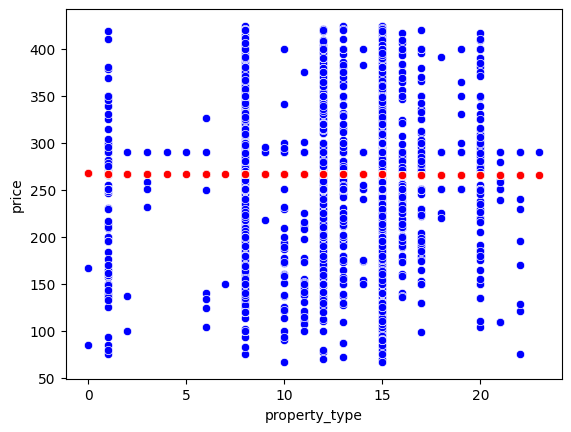

In [19]:
# Visualizamos la gráfica comparartiva entre el precio real y el precio predecido 

sns.scatterplot(x = 'property_type', y = 'price', color = "blue", data = df)
sns.scatterplot(x = 'property_type', y = 'Predicciones', color = "red", data = df)

In [20]:
# Corroboramos cual es el coeficiente de determianción de nuestro modelo
coef_Deter = model.score(X = Vars_Indep, y = Var_Dep)
coef_Deter

1.906823150765735e-05

In [21]:
# Corroboramos cual es el coeficiente de correlación de nuestro modelo
coef_Correl = np.sqrt(coef_Deter)
coef_Correl

0.004366718620160606

In [22]:
# Filtrar y eliminar columnas de tipo objeto
df = df.select_dtypes(exclude=['object'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7776 entries, 0 to 7775
Data columns (total 34 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Predicciones                                  7776 non-null   float64
 1   property_type                                 7776 non-null   int32  
 2   id                                            7776 non-null   int64  
 3   scrape_id                                     7776 non-null   int64  
 4   host_id                                       7776 non-null   float64
 5   host_listings_count                           7776 non-null   float64
 6   host_total_listings_count                     7776 non-null   float64
 7   latitude                                      7776 non-null   float64
 8   longitude                                     7776 non-null   float64
 9   accommodates                                  7776 non-null   f

In [23]:
# Graficamos todas las dispersiones entre todas las variables 
sns.pairplot(df)

c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning

In [24]:
# Encontramos todas las correlaciones entre las variables 
Corr_Factors = df.corr()

# Encontramos el valor absoluto de todas las correlaciones entre las variables
Corr_Factors1 = abs(Corr_Factors)

Corr_Factors1

,Predicciones,property_type,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
Predicciones,1.000000,1.000000,0.045093,NaN,0.006596,NaN,0.015042,0.011093,0.007631,0.010997,...,0.014538,0.040542,0.034947,0.044476,0.039458,0.020869,NaN,NaN,NaN,NaN
property_type,1.000000,1.000000,0.045093,NaN,0.006596,NaN,0.015042,0.011093,0.007631,0.010997,...,0.014538,0.040542,0.034947,0.044476,0.039458,0.020869,NaN,NaN,NaN,NaN
id,0.045093,0.045093,1.000000,NaN,0.168264,NaN,0.046439,0.005427,0.007135,0.032918,...,0.154043,0.110028,0.124158,0.085262,0.155757,0.142497,NaN,NaN,NaN,NaN
scrape_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
host_id,0.006596,0.006596,0.168264,NaN,1.000000,NaN,0.091400,0.026894,0.008886,0.010568,...,0.001072,0.015239,0.022450,0.018348,0.021042,0.012957,NaN,NaN,NaN,NaN
host_listings_count,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
host_total_listings_count,0.015042,0.015042,0.046439,NaN,0.091400,NaN,1.000000,0.013678,0.019338,0.081637,...,0.036878,0.032138,0.009655,0.012645,0.000280,0.017264,NaN,NaN,NaN,NaN
latitude,0.011093,0.011093,0.005427,NaN,0.026894,NaN,0.013678,1.000000,0.053018,0.051862,...,0.028392,0.030340,0.032812,0.006981,0.117067,0.014148,NaN,NaN,NaN,NaN
longitude,0.007631,0.007631,0.007135,NaN,0.008886,NaN,0.019338,0.053018,1.000000,0.080276,...,0.038407,0.044135,0.006645,0.016506,0.003043,0.019490,NaN,NaN,NaN,NaN
accommodates,0.010997,0.010997,0.032918,NaN,0.010568,NaN,0.081637,0.051862,0.080276,1.000000,...,0.075920,0.072320,0.014720,0.020412,0.075514,0.061339,NaN,NaN,NaN,NaN


c:\Users\yulia\AppData\Local\Programs\Python\Python313\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


<Axes: >

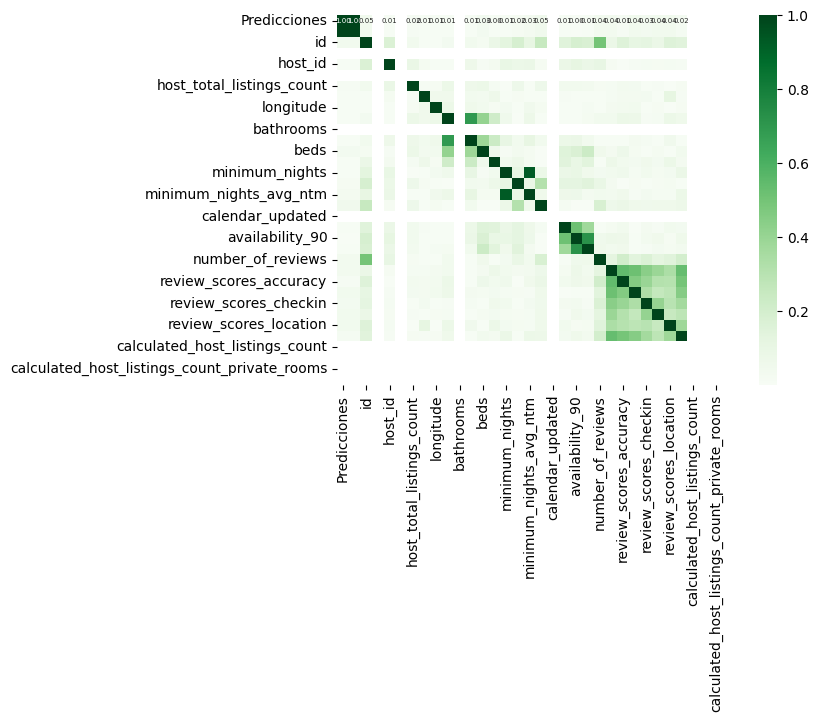

In [25]:
# Ajustamos el mapa de calor de los coeficientes de correlación
Heat_Map = sns.heatmap(Corr_Factors1, cmap = 'Greens', annot = True, fmt = ".2f", annot_kws={"size": 5})

Heat_Map